<center><h1>Time Forecasting Project</h1></center>
<center><h2>M1 IA Elearning - mai 2023</h2></center>
<center><h3>Projet présenté par Shabboo Aleagha, Khedoudja Rym Merad, Mike Duran et Ophélie Engasser</h3></center>



# Introduction

## Data Access

In [62]:
# importation des librairies
from google.colab import files
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.deterministic import DeterministicProcess
from statsmodels.tsa.deterministic import CalendarFourier
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor

# pour le filtrage des warnings
import warnings
warnings.filterwarnings('ignore')
warnings.warn('DelftStack')
warnings.warn('Do not show this message')
print("No Warning Shown")

No Warning Shown


Les parties s’appliquent sur l’ensemble d’entraînement (donc **DailyDelhiClimateTrain.csv**)

In [2]:
uploaded = files.upload()
path = "DailyDelhiClimateTrain.csv"

Saving DailyDelhiClimateTrain.csv to DailyDelhiClimateTrain.csv


In [63]:
data = pd.read_csv(path, index_col='date')
data.head()

,meantemp,humidity,wind_speed,meanpressure
date,,,,
2013-01-01,10.000000,84.500000,0.000000,1015.666667
2013-01-02,7.400000,92.000000,2.980000,1017.800000
2013-01-03,7.166667,87.000000,4.633333,1018.666667
2013-01-04,8.666667,71.333333,1.233333,1017.166667
2013-01-05,6.000000,86.833333,3.700000,1016.500000


In [64]:
# vérifier les dimensions du dataframe
data.shape

(1462, 4)

In [65]:
# vérifier les types des données
data.dtypes

meantemp        float64
humidity        float64
wind_speed      float64
meanpressure    float64
dtype: object

In [66]:
# vérifier s'il existe des NaN
data.isna().sum()

meantemp        0
humidity        0
wind_speed      0
meanpressure    0
dtype: int64

Nous allons travailler avec le dataframe **df** et la variable **meantemp**

In [7]:
df = data[["meantemp"]]
df.head(5)

,meantemp
date,
2013-01-01,10.000000
2013-01-02,7.400000
2013-01-03,7.166667
2013-01-04,8.666667
2013-01-05,6.000000


# Partie 1

 En utilisant la colonne de température moyenne; soit la meantemp, faites une analyse :
- **Time Step (La régression de la température moyenne en fonction du temps)**

In [8]:
# nous créons la colonne time en se basant sur les index de date, afin de simplifier la représentation ainsi que la régression
df["time"] = np.arange(len(df.index))
df.head(5)

,meantemp,time
date,,
2013-01-01,10.000000,0
2013-01-02,7.400000,1
2013-01-03,7.166667,2
2013-01-04,8.666667,3
2013-01-05,6.000000,4


In [9]:
# créons un modèle de régression linéaire de la température en fonction du temps
# données d'entraînement
X = df.loc[:, ['time']]  # feature
y = df.loc[:, 'meantemp']  # target

# entraînement du modèle
model = LinearRegression()
model.fit(X, y)

# stockage des valeurs ajustées sous la forme d'une série chronologique
y_pred = pd.Series(model.predict(X), index=X.index)

# obtention de l'équation de la droite
print(f'Y = {model.coef_[0]} * X + {model.intercept_}')

Y = 0.0022705303257685404 * X + 23.836898252787844


Text(0.5, 1.0, 'Time Plot of mean Temperature')

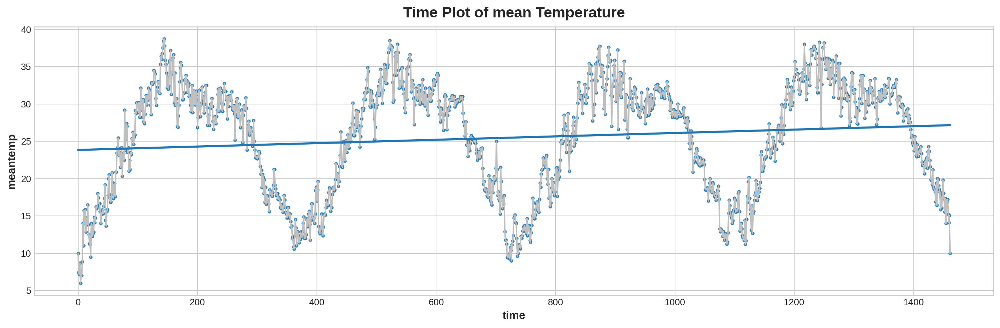

In [10]:
# visualisons la série et traçons une droite de régression
plt.style.use("seaborn-whitegrid")
plt.rc(
    "figure",
    autolayout=True,
    figsize=(11, 4),
    titlesize=18,
    titleweight='bold',
)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
%config InlineBackend.figure_format = 'retina'

fig, ax = plt.subplots(figsize=(15,5))
ax.plot('time', 'meantemp', data=df, color='0.75') # on set la couleur des données pour mieux les visualiser
ax = sns.regplot(x='time', y='meantemp', data=df, ci=None, scatter_kws={'s': 8}) # on applique la ligne de regression dessus.
ax.set_title('Time Plot of mean Temperature') # on set le titre.

**Time step permet de modéliser la dépendance au temps**. Selon l'équation de la droite on peut en déduire que la température est liée linéairement au temps. Cela évoque une tendance monotone qui croît légèrement dans le temps. Si l'on regarde le graphique on peut voir également une fluctuation selon des cycles qui pourraient évoquer une saisonnalité.

- **Lag Feature (La régression en fonction de l’instant n-1)**

In [11]:
# créons le shift de la colonne Lag feature
df["Lag_1"]=df["meantemp"].shift(1)
df = df.reindex(columns=['meantemp', 'Lag_1'])
df.head(5)

,meantemp,Lag_1
date,,
2013-01-01,10.000000,NaN
2013-01-02,7.400000,10.000000
2013-01-03,7.166667,7.400000
2013-01-04,8.666667,7.166667
2013-01-05,6.000000,8.666667


In [12]:
# créons un modèle de régression linéaire de la température avec la température de la veille
# données d'entraînement
X = df.loc[:, ['Lag_1']]
X.dropna(inplace=True)  # on drop le NaN dans la série feature
y = df.loc[:, 'meantemp']  # on créé la target
y, X = y.align(X, join='inner')  # on fait un inner join par les index

# entraînement du modèle
model = LinearRegression()
model.fit(X, y)

# stockage des valeurs ajustées sous la forme d'une série chronologique
y_pred = pd.Series(model.predict(X), index=X.index)

# obtention de l'équation de la droite
print(f'Y = {model.coef_[0]} * X + {model.intercept_}')

Y = 0.9740674782673876 * X + 0.6614381865604209


Text(0.5, 1.0, 'Lag Plot of mean Temperature')

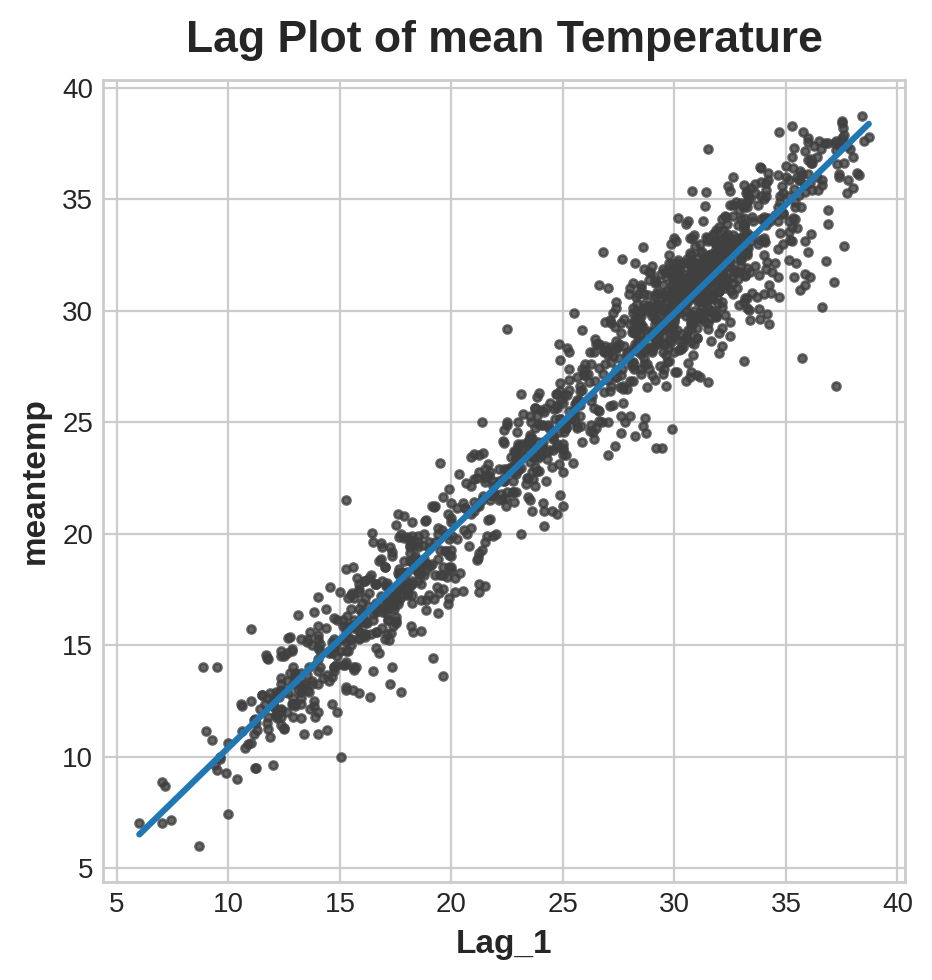

In [13]:
# visualisons sur un graphique et traçons une droite
fig, ax = plt.subplots(figsize=(15,5))
ax = sns.regplot(x='Lag_1', y='meantemp', data=df, ci=None, scatter_kws={'s': 8, 'color':'0.25'})
ax.set_aspect('equal')
ax.set_title('Lag Plot of mean Temperature')

Lag feature permet de modéliser la dépendance sérielle : c'est-à-dire le fait qu'une observation puisse être prédite à partir de l'observation précédente (n-1) (ici, les températures à partir des températures de la veille). D'après l'équation de la droite il existe une relation linéaire entre la variable target et ses valeurs à l'instant n-1 (auto-correlation). On peut en conclure que les valeurs moyennes de températures du passé récent sont un bon prédicteur de la variable meantemp.

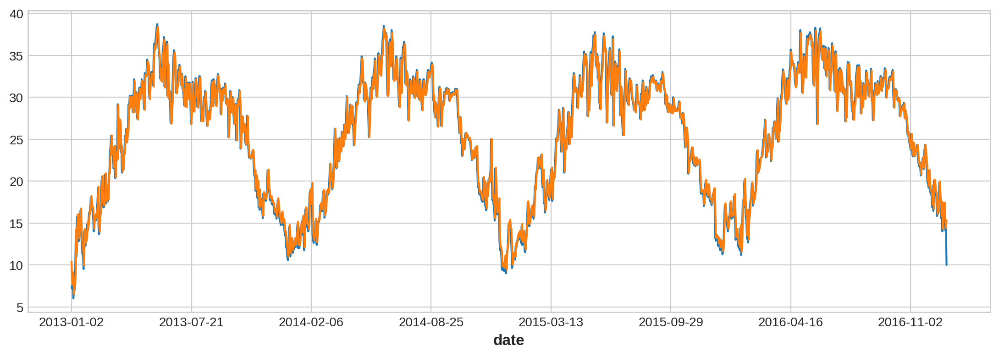

In [14]:
# voyons l'allure de la courbe générée par la prédiction à partir de lag feature par rapport aux données réelles
ax = y.plot() # y réel : courbe orange
ax = y_pred.plot() # y pred : courbe bleue

Les deux courbes sont presque superposées, ce qui confirme notre réflexion.

# Partie 2

En réappliquant tous les processus vus en cours, analyser la tendance :

- **Tracer des graphes de moyennes glissantes (moving average)**

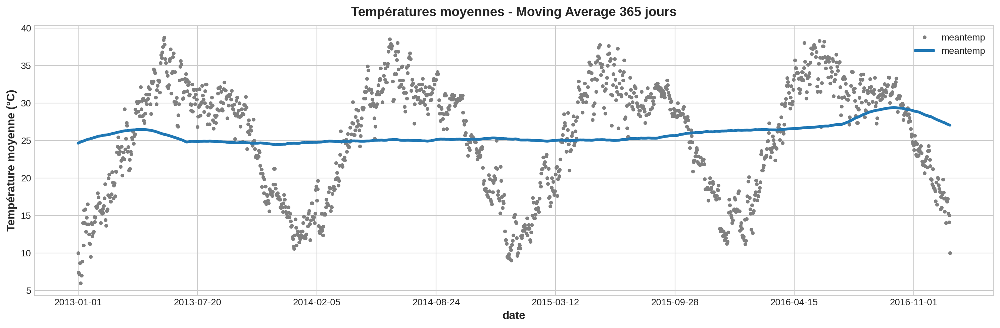

In [15]:
# traçons le graph moving average
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 5))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'

fig, ax = plt.subplots(figsize=(15,5))

moving_average = df['meantemp'].rolling(
    window=365,       # fenêtre 365 jours
    center=True,      # placer la moyenne au centre de la fenêtre
    min_periods=183,  # choisir environ la moitié de la taille de la fenêtre
).mean()              # calculer la moyenne

ax = df['meantemp'].plot(style=".", color="0.5")
moving_average.plot(
    ax=ax, linewidth=3, title="Températures moyennes - Moving Average 365 jours", legend=False
)
ax.set_ylabel("Température moyenne (°C)")
plt.legend()

- **Utiliser les méthodes de Trend Engineering par le biais de la bibliothèque Deterministic Process afin de déterminer la tendance optimale.**
- **Faire des graphe pour la tendance linéaire, quadratique, cubique. Tester pour d’autres dimensions.**

Traitons les 2 questions ensemble (1 ajustement -> 1 graph)

In [16]:
# tendance linéaire : y = a * time + b
dp_order1 = DeterministicProcess(
    index=df.index,      # l'index correspond aux dates
    constant=True,       # ajoute l'ordonnée à l'origine (y_intercept)
    order=1,             # the time dummy (trend)
    drop=True,           # éviter la colinéarité
)
# features à partir des dates de notre échantillon (fonction in sample())
X = dp_order1.in_sample()
X.head()

,const,trend
date,,
2013-01-01,1.0,1.0
2013-01-02,1.0,2.0
2013-01-03,1.0,3.0
2013-01-04,1.0,4.0
2013-01-05,1.0,5.0


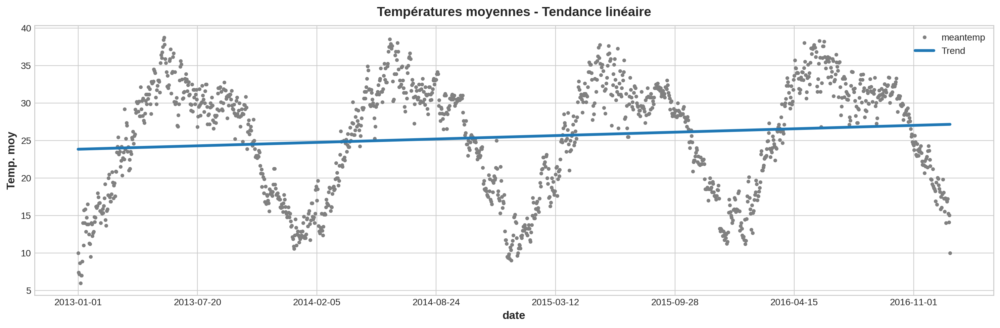

In [17]:
# modélisation et visualisation
# données d'entraînement
y = df["meantemp"]  # the target

# entraînement du modèle
model = LinearRegression(fit_intercept=False) # on ôte l'ordonnée à l'origine
model.fit(X, y)

# stockage des valeurs ajustées sous la forme d'une série chronologique
y_pred = pd.Series(model.predict(X), index=X.index)

# graphique
fig, ax = plt.subplots(figsize=(15,5))
ax = y.plot(style=".", color="0.5", title="Températures moyennes - Tendance linéaire", ylabel='Temp. moy')
ax = y_pred.plot(ax=ax, linewidth=3, label="Trend")
plt.legend()

On effectue le calcul sur nos données de test, afin de verifier si notre modèle ne souffre pas de underfitting.

R2 accuracy: 0.0%
RMSE accuracy: 5370.0%
MAE accuracy: 636.0%


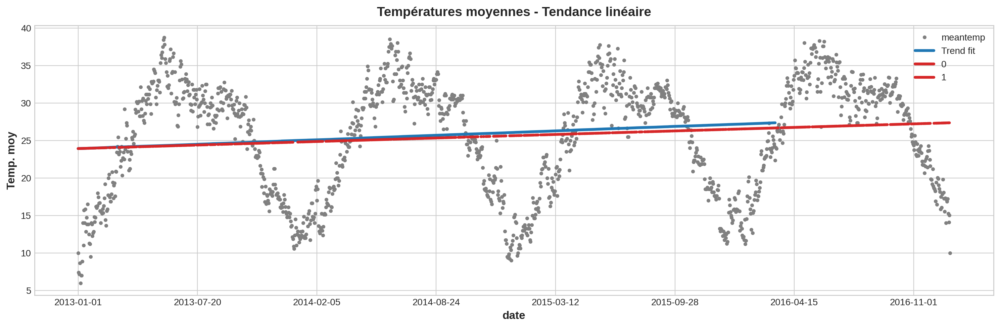

In [18]:
# données d'entraînement
y = df["meantemp"]  # the target

dp_order1 = DeterministicProcess(
    index=df.index,      # l'index correspond aux dates
    constant=True,       # ajoute l'ordonnée à l'origine (y_intercept)
    order=1,             # the time dummy (trend)
    drop=True,           # éviter la colinéarité
)
# features à partir des dates de notre échantillon (fonction in sample())
X = dp_order1.in_sample()

# Create target series and data splits
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=42)
y_test = y_test.sort_index()
# Fit and predict
model = LinearRegression()  
model.fit(X_train, y_train)


y_fit = pd.Series(model.predict(X_train), index=X_train.index)
y_fit = y_fit.sort_index()
y_pred = pd.Series(model.predict(X_test), index=X_test.index)
y_pred = y_pred.sort_index()
y_prediction=pd.concat([y_fit,y_pred],axis=1)
y_prediction = y_prediction.sort_index()
#test d'accuracy
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
score = r2_score(y_test, y_pred)
print("R2 accuracy: {}%".format(round(score, 2) *100))
score = mean_squared_error(y_test, y_pred)
print("RMSE accuracy: {}%".format(round(score, 2) *100))
score = mean_absolute_error(y_test, y_pred)
print("MAE accuracy: {}%".format(round(score, 2) *100))

# graphique
fig, ax = plt.subplots(figsize=(15,5))
ax = y.plot(style=".", color="0.5", title="Températures moyennes - Tendance linéaire", ylabel='Temp. moy')
ax = y_fit.plot(ax=ax, linewidth=3, label="Trend fit")
ax = y_prediction.plot(ax=ax, linewidth=3, label="Trend Predicted",color="C3")
plt.legend()

On observe une très mauvaise prédiction, on est clairement dans l'underfitting, il serait donc intéressant d'augmenter l'ordre.

On effectue la tendance quadratique.

In [19]:
# tendance quadratique : y = a * time ** 2 + b * time + c
dp_order2 = DeterministicProcess(
    index=df.index,  
    constant=True,    
    order=2,      
    drop=True,   
)
X = dp_order2.in_sample()
X.head()

,const,trend,trend_squared
date,,,
2013-01-01,1.0,1.0,1.0
2013-01-02,1.0,2.0,4.0
2013-01-03,1.0,3.0,9.0
2013-01-04,1.0,4.0,16.0
2013-01-05,1.0,5.0,25.0


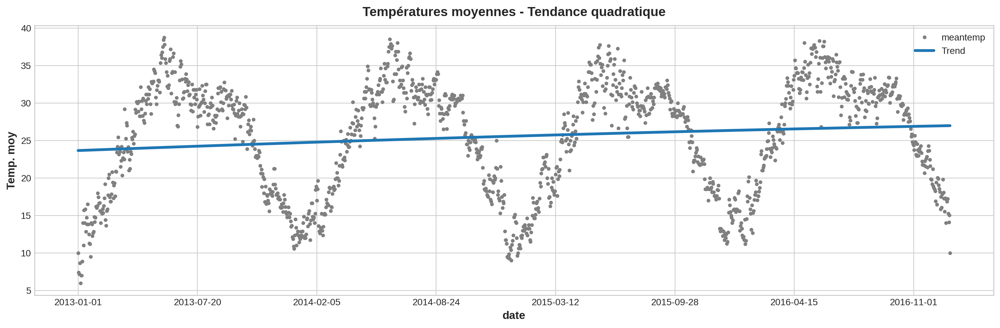

In [20]:
# modélisation et visualisation
y = df["meantemp"]  # the target
model = LinearRegression(fit_intercept=False)
model.fit(X, y)
y_pred = pd.Series(model.predict(X), index=X.index)
y_pred = y_pred.sort_index()
fig, ax = plt.subplots(figsize=(15,5))
ax = y.plot(style=".", color="0.5", title="Températures moyennes - Tendance quadratique", ylabel='Temp. moy')
ax = y_pred.plot(ax=ax, linewidth=3, label="Trend")
plt.legend()

R2 accuracy: -4.0%
RMSE accuracy: 5583.0%
MAE accuracy: 641.0%


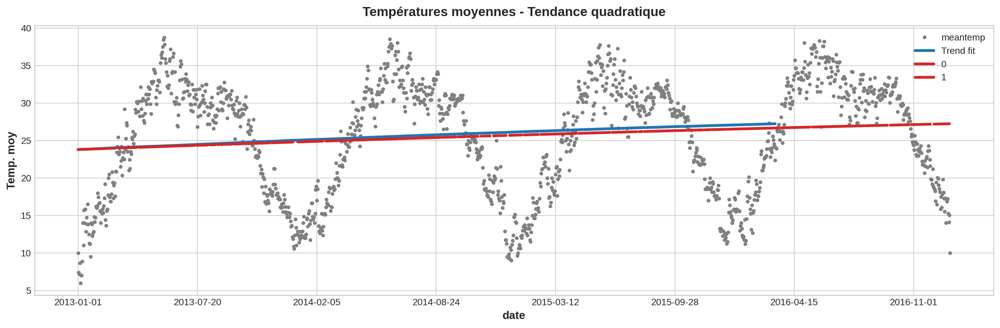

In [21]:
# données d'entraînement
y = df["meantemp"]  # the target

dp_order1 = DeterministicProcess(
    index=df.index,      # l'index correspond aux dates
    constant=True,       # ajoute l'ordonnée à l'origine (y_intercept)
    order=2,             # the time dummy (trend)
    drop=True,           # éviter la colinéarité
)
# features à partir des dates de notre échantillon (fonction in sample())
X = dp_order1.in_sample()

# Create target series and data splits
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=42)

# Fit and predict
model = LinearRegression()  
model.fit(X_train, y_train)


y_fit = pd.Series(model.predict(X_train), index=X_train.index)
y_fit = y_fit.sort_index()
y_pred = pd.Series(model.predict(X_test), index=X_test.index)
y_pred = y_pred.sort_index()
y_prediction=pd.concat([y_fit,y_pred],axis=1)
y_prediction = y_prediction.sort_index()
#test d'accuracy
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
score = r2_score(y_test, y_pred)
print("R2 accuracy: {}%".format(round(score, 2) *100))
score = mean_squared_error(y_test, y_pred)
print("RMSE accuracy: {}%".format(round(score, 2) *100))
score = mean_absolute_error(y_test, y_pred)
print("MAE accuracy: {}%".format(round(score, 2) *100))

# graphique
fig, ax = plt.subplots(figsize=(15,5))
ax = y.plot(style=".", color="0.5", title="Températures moyennes - Tendance quadratique", ylabel='Temp. moy')
ax = y_fit.plot(ax=ax, linewidth=3, label="Trend fit")
ax = y_prediction.plot(ax=ax, linewidth=3, label="Trend Predicted",color="C3")
plt.legend()

In [22]:
# tendance cubique : y = a * time ** 3 + b * time ** 2 + c * time + d
dp_order3 = DeterministicProcess(
    index=df.index, 
    constant=True,     
    order=3,         
    drop=True,       
)
X = dp_order3.in_sample()
X.head()

,const,trend,trend_squared,trend_cubed
date,,,,
2013-01-01,1.0,1.0,1.0,1.0
2013-01-02,1.0,2.0,4.0,8.0
2013-01-03,1.0,3.0,9.0,27.0
2013-01-04,1.0,4.0,16.0,64.0
2013-01-05,1.0,5.0,25.0,125.0


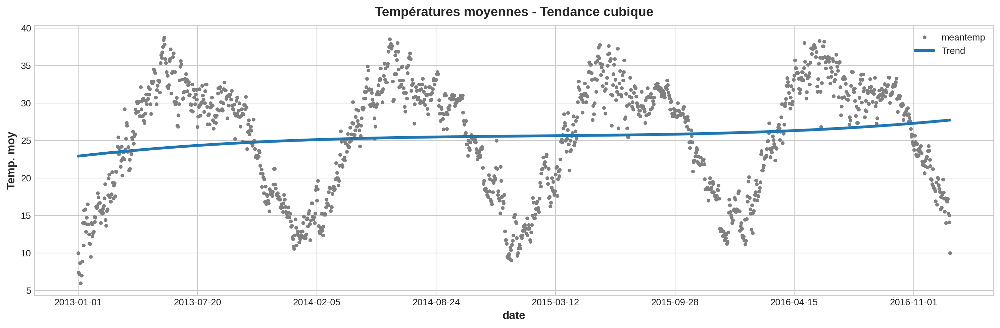

In [23]:
# modélisation et visualisation
y = df["meantemp"]  # the target
model = LinearRegression(fit_intercept=False)
model.fit(X, y)
y_pred = pd.Series(model.predict(X), index=X.index)
y_pred = y_pred.sort_index()
fig, ax = plt.subplots(figsize=(15,5))
ax = y.plot(style=".", color="0.5", title="Températures moyennes - Tendance cubique", ylabel='Temp. moy')
ax = y_pred.plot(ax=ax, linewidth=3, label="Trend")
plt.legend()

Analyse des predictions de l'ordre 3

R2 accuracy: -4.0%
RMSE accuracy: 5612.0%
MAE accuracy: 641.0%


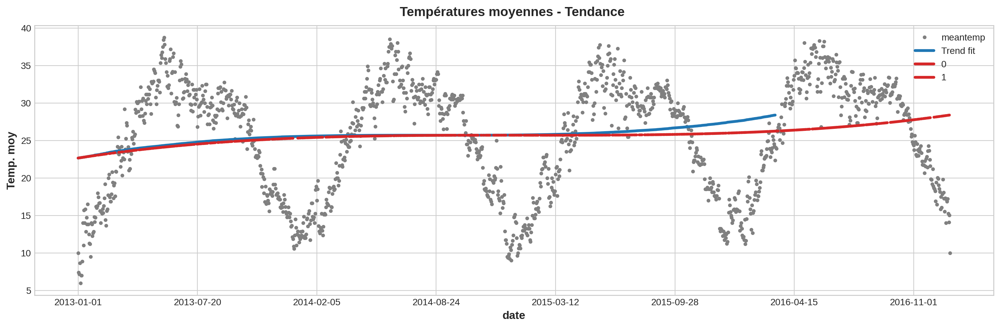

In [24]:
# données d'entraînement
y = df["meantemp"]  # the target

# tendance cubique : y = a * time ** 3 + b * time ** 2 + c * time + d
dp_order3 = DeterministicProcess(
    index=df.index, 
    constant=True,     
    order=3,         
    drop=True,       
)
X = dp_order3.in_sample()

# Create target series and data splits
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=42)

# Fit and predict
model = LinearRegression()  
model.fit(X_train, y_train)


y_fit = pd.Series(model.predict(X_train), index=X_train.index)
y_fit = y_fit.sort_index()
y_pred = pd.Series(model.predict(X_test), index=X_test.index)
y_pred = y_pred.sort_index()
y_prediction=pd.concat([y_fit,y_pred],axis=1)
y_prediction = y_prediction.sort_index()
#test d'accuracy
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
score = r2_score(y_test, y_pred)
print("R2 accuracy: {}%".format(round(score, 2) *100))
score = mean_squared_error(y_test, y_pred)
print("RMSE accuracy: {}%".format(round(score, 2) *100))
score = mean_absolute_error(y_test, y_pred)
print("MAE accuracy: {}%".format(round(score, 2) *100))

# graphique
fig, ax = plt.subplots(figsize=(15,5))
ax = y.plot(style=".", color="0.5", title="Températures moyennes - Tendance ", ylabel='Temp. moy',)
ax = y_fit.plot(ax=ax, linewidth=3, label="Trend fit")
ax = y_prediction.plot(ax=ax, linewidth=3, label="Trend Predicted",color="C3")
plt.legend()


Resultat

In [25]:
# tendance degré 4
dp_order4 = DeterministicProcess(
    index=df.index, 
    constant=True,   
    order=4,        
)
X = dp_order4.in_sample()
X.head()

,const,trend,trend_squared,trend_cubed,trend**4
date,,,,,
2013-01-01,1.0,1.0,1.0,1.0,1.0
2013-01-02,1.0,2.0,4.0,8.0,16.0
2013-01-03,1.0,3.0,9.0,27.0,81.0
2013-01-04,1.0,4.0,16.0,64.0,256.0
2013-01-05,1.0,5.0,25.0,125.0,625.0


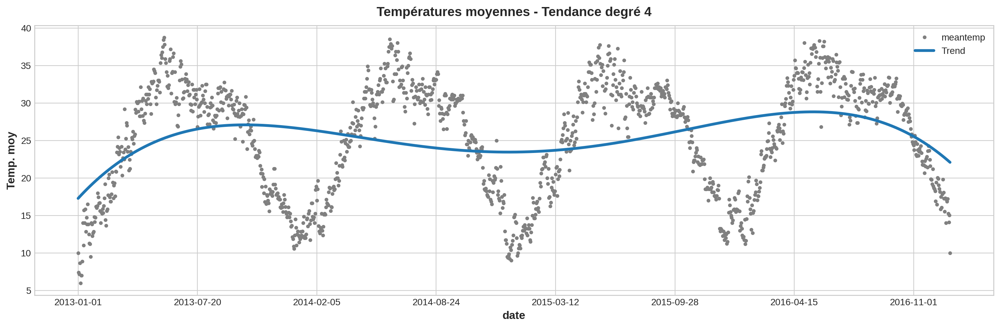

In [26]:
# modélisation et visualisation
y = df["meantemp"]  # the target
model = LinearRegression(fit_intercept=False)
model.fit(X, y)
y_pred = pd.Series(model.predict(X), index=X.index)
y_pred = y_pred.sort_index()
fig, ax = plt.subplots(figsize=(15,5))
ax = y.plot(style=".", color="0.5", title="Températures moyennes - Tendance degré 4", ylabel='Temp. moy')
ax = y_pred.plot(ax=ax, linewidth=3, label="Trend")
plt.legend()

Analyse des predictions de données de test avec ordre 4

R2 accuracy: -15.0%
RMSE accuracy: 6185.0%
MAE accuracy: 667.0%


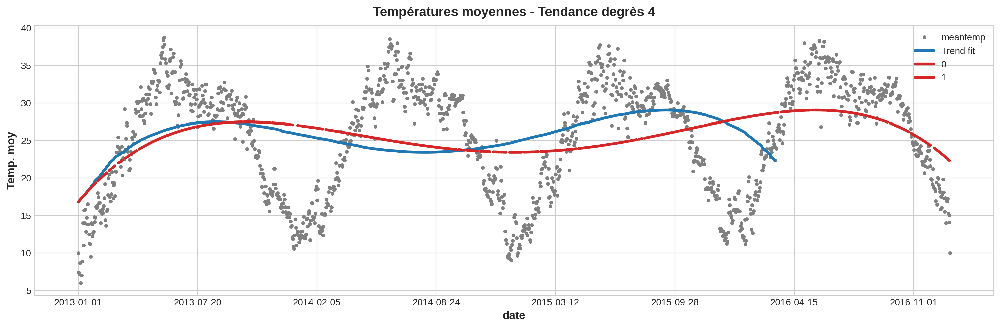

In [27]:
# données d'entraînement
y = df["meantemp"]  # the target
# tendance degré 4
dp_order4 = DeterministicProcess(
    index=df.index, 
    constant=True,   
    order=4,        
)
X = dp_order4.in_sample()

# Create target series and data splits
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=42)

# Fit and predict
model = LinearRegression()  
model.fit(X_train, y_train)


y_fit = pd.Series(model.predict(X_train), index=X_train.index)
y_fit = y_fit.sort_index()
y_pred = pd.Series(model.predict(X_test), index=X_test.index)
y_pred = y_pred.sort_index()
y_prediction=pd.concat([y_fit,y_pred],axis=1)
y_prediction = y_prediction.sort_index()
#test d'accuracy
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
score = r2_score(y_test,y_pred)
print("R2 accuracy: {}%".format(round(score, 2) *100))
score = mean_squared_error(y_test,y_pred)
print("RMSE accuracy: {}%".format(round(score, 2) *100))
score = mean_absolute_error(y_test, y_pred)
print("MAE accuracy: {}%".format(round(score, 2) *100))

# graphique
fig, ax = plt.subplots(figsize=(15,5))
ax = y.plot(style=".", color="0.5", title="Températures moyennes - Tendance degrès 4", ylabel='Temp. moy')
ax = y_fit.plot(ax=ax, linewidth=3, label="Trend fit")
ax = y_prediction.plot(ax=ax, linewidth=3, label="Trend Predicted",color="C3")
plt.legend()

In [28]:
# tendance degré 6
dp_order6 = DeterministicProcess(
    index=df.index, 
    constant=True,      
    order = 6,         
    drop=True,  
)
X = dp_order6.in_sample()
X.head()

,const,trend,trend_squared,trend_cubed,trend**5
date,,,,,
2013-01-01,1.0,1.0,1.0,1.0,1.0
2013-01-02,1.0,2.0,4.0,8.0,32.0
2013-01-03,1.0,3.0,9.0,27.0,243.0
2013-01-04,1.0,4.0,16.0,64.0,1024.0
2013-01-05,1.0,5.0,25.0,125.0,3125.0


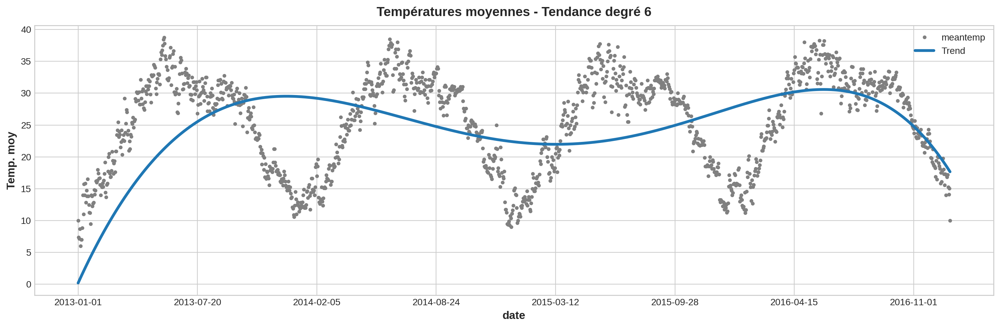

In [29]:
# modélisation et visualisation
y = df["meantemp"]
model = LinearRegression(fit_intercept=False)
model.fit(X, y)
y_pred = pd.Series(model.predict(X), index=X.index)
y_pred = y_pred.sort_index()
fig, ax = plt.subplots(figsize=(15,5))
ax = y.plot(style=".", color="0.5", title="Températures moyennes - Tendance degré 6", ylabel='Temp. moy')
ax = y_pred.plot(ax=ax, linewidth=3, label="Trend")
plt.legend()

R2 accuracy: 2.0%
RMSE accuracy: 5243.0%
MAE accuracy: 609.0%


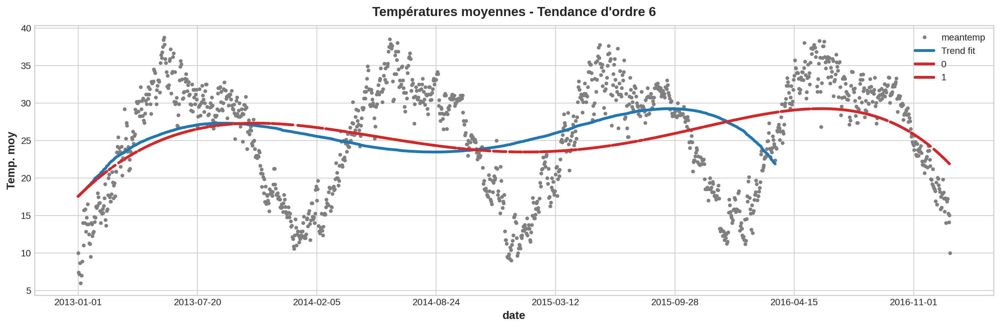

In [30]:
# données d'entraînement
y = df["meantemp"]  # the target

dp_order6 = DeterministicProcess(
    index=df.index, 
    constant=True,     
    order=6,         
    drop=True,       
)
X = dp_order6.in_sample()

# Create target series and data splits
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=42)

# Fit and predict
model = LinearRegression()  
model.fit(X_train, y_train)
y_test = y_test.sort_index()
y_fit = pd.Series(model.predict(X_train), index=X_train.index)
y_fit = y_fit.sort_index()
y_pred = pd.Series(model.predict(X_test), index=X_test.index).sort_index(ascending = True)
y_pred = y_pred.sort_index()
y_prediction=pd.concat([y_fit,y_pred],axis=1)
y_prediction = y_prediction.sort_index()
#test d'accuracy
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
score = r2_score(y_test, y_pred)
print("R2 accuracy: {}%".format(round(score, 2) *100))
score = mean_squared_error(y_test, y_pred)
print("RMSE accuracy: {}%".format(round(score, 2) *100))
score = mean_absolute_error(y_test, y_pred)
print("MAE accuracy: {}%".format(round(score, 2) *100))

# graphique
fig, ax = plt.subplots(figsize=(15,5))
ax = y.plot(style=".", color="0.5", title="Températures moyennes - Tendance d'ordre 6", ylabel='Temp. moy')
ax = y_fit.plot(ax=ax, linewidth=3, label="Trend fit")
ax = y_prediction.plot(ax=ax, linewidth=3, label="Trend Predicted",color="C3")
plt.legend()

En ayant testé les modèles de prédiction avec les différents ordres, nous choisissons l'ordre 6. 

Pour faire ce choix il a fallu se baser sur les caractéristiques visuelles et la valeur de l'accuracy qui a été calculé de 3 façons différentes:
R2 accuracy: 2.0% => La moyenne au carré des résiduels (n'a pas d'influence sur la qualité de la prédiction)
RMSE accuracy: 5243.0% => la moyenne des termes résiduels au carré 
MAE accuracy: 609.0% => La moyenne des erreurs en valeur absolue 

- **Faire un forecast pour 15 jours futurs**

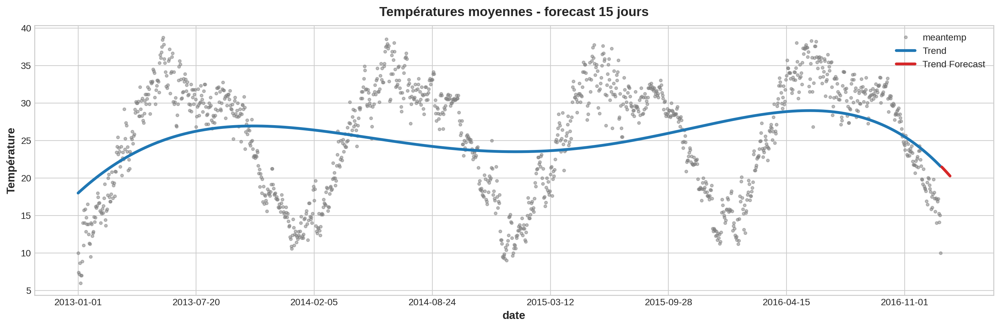

In [31]:
# utiliser la fonction out_of_sample() à partie du modèle de la tendance 1 (pour cela, relancer le dp_order1)
y = df["meantemp"]
dp_order6 = DeterministicProcess(
    index=df.index,      # l'index correspond aux dates
    constant=True,       # ajoute l'ordonnée à l'origine (y_intercept)
    order=6,             # the time dummy (trend)
    drop=True,           # éviter la colinéarité
)
X = dp_order6.in_sample() #c'est ce qu'il manquait.
X_fore = dp_order6.out_of_sample(steps=15)

model = LinearRegression()
model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=X.index)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)
fig, ax = plt.subplots(figsize=(15,5))
ax = y.plot(style=".", color="0.5", alpha=0.5, title="Températures moyennes - forecast 15 jours", ylabel="Température")
ax = y_pred.plot(ax=ax, linewidth=3, label="Trend", color='C0')
ax = y_fore.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C3')
plt.legend()

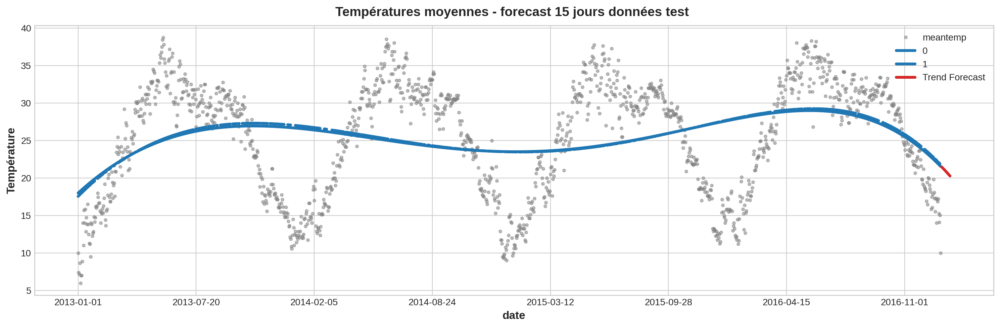

In [32]:
# utiliser la fonction out_of_sample() à partie du modèle de la tendance 1 (pour cela, relancer le dp_order1)
y = df["meantemp"]
dp_order6 = DeterministicProcess(
    index=df.index,      # l'index correspond aux dates
    constant=True,       # ajoute l'ordonnée à l'origine (y_intercept)
    order=6,             # the time dummy (trend)
    drop=True,           # éviter la colinéarité
)

X_fore = dp_order6.out_of_sample(steps=15)

y_pred_test = pd.Series(model.predict(X_test), index=X_test.index)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)
X_test = X_test.sort_index()
X_fore = X_fore.sort_index()
y_pred_test = y_pred.sort_index()
y_prediction = pd.concat([y_fit,y_pred],axis=1)
y_prediction = y_prediction.sort_index()
fig, ax = plt.subplots(figsize=(15,5))
ax = y.plot(style=".", color="0.5", alpha=0.5, title="Températures moyennes - forecast 15 jours données test ", ylabel="Température")
ax = y_prediction.plot(ax=ax, linewidth=3, label="Trend", color='C0')
ax = y_fore.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C3')
plt.legend()

- **Enlevez la composante de tendance de votre série.**

<Axes: title={'center': 'Températures sans la tendance'}, xlabel='date'>

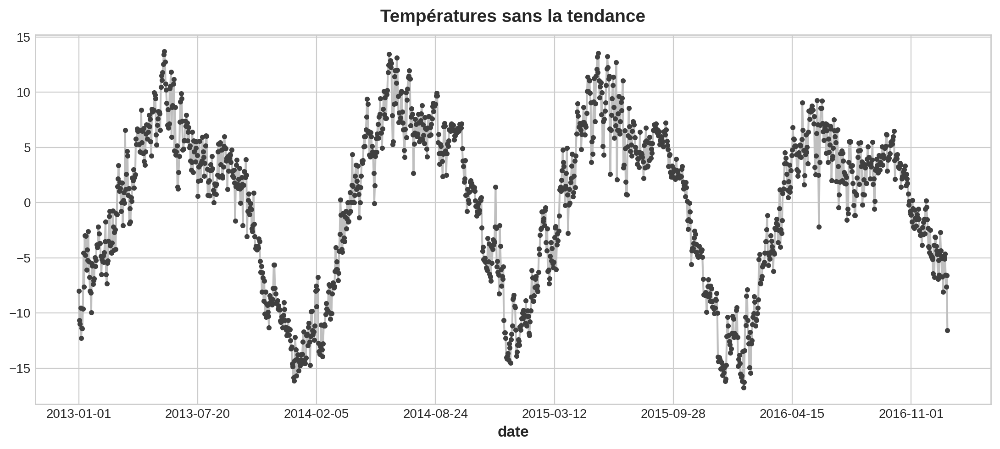

In [33]:
# on enlève tous les termes de tendance et on laisse le reste
y_detrended = y - y_pred
y_detrended.plot(**plot_params, title="Températures sans la tendance")

Il ne reste que la saisonnalité, les cycles et les résidus qui sont fixes (bruits blancs).

# Partie 3

En réitérant les mécanismes vus en cours, étudier la saisonnalité de la série temporelle :

- **Réaliser des Seasonal Plots**

In [34]:
#installation of learntools
!git clone https://github.com/Kaggle/learntools.git
!mv learntools learntools_dir
!mv learntools_dir/learntools learntools
from learntools.deep_learning import decode_predictions

Cloning into 'learntools'...
remote: Enumerating objects: 18446, done.
remote: Counting objects: 100% (826/826), done.
remote: Compressing objects: 100% (430/430), done.
remote: Total 18446 (delta 471), reused 702 (delta 395), pack-reused 17620
Receiving objects: 100% (18446/18446), 105.11 MiB | 23.44 MiB/s, done.
Resolving deltas: 100% (13583/13583), done.


In [35]:
# Setup feedback system
#from learntools.core import binder
#binder.bind(globals())
#from learntools.time_series.ex3 import *

# Setup notebook
import learntools as lt

from pathlib import Path
from learntools.time_series.style import *  # plot style settings
from learntools.time_series.utils import plot_periodogram, seasonal_plot

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from statsmodels.tsa.seasonal import seasonal_decompose

<Axes: title={'center': 'Seasonal Plot (year/dayofyear)'}, xlabel='dayofyear', ylabel='meantemp'>

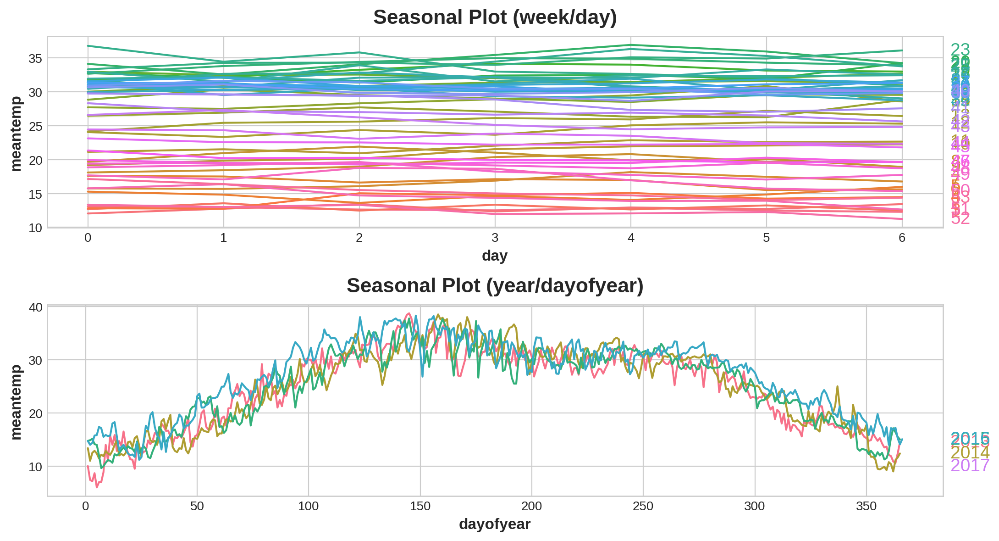

In [36]:
# traçons un seasonal plot week/day et un year/dayofyear
X = df["meantemp"].to_frame()
X.index=pd.to_datetime(X.index) # il faut qu'on transforme notre index en format date, car sinon cela ne marche pas. 

#X = y_detrended.to_frame()
#X = X.rename(columns={0:"meantemp"})

# jours par semaine
X["week"] = X.index.week 
X["day"] = X.index.dayofweek

# jours par an
X["year"] = X.index.year
X["dayofyear"] = X.index.dayofyear

fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(11, 6))
seasonal_plot(X, y="meantemp", period="week", freq="day", ax=ax0)
seasonal_plot(X, y="meantemp", period="year", freq="dayofyear", ax=ax1)

Comme nous pouvons le constater, il est difficile de voir un pic de montée de temperature, cela nous permet de anticiper plusieurs choses: 
- les données sont bruyantes. (il serait envisageable d'utiliser une technique de lissage, comme la moyenne mobile, qui permet de réduire le bruit, ref ici: http://ressources.aunege.fr/nuxeo/site/esupversions/62684a38-d915-4322-9553-3566bd2aa3b9/co/1Lissage.html

- **la periodicité saisonnière est plus longue que la semaine**. (on pourrais vérifier une saisonalité plus longue que une semaine.) en utilisant le fourier Features.

**Sur le seasonal plot week/day** : nous observons peu de variation des températures sur une semaine, et ce quelle que soit la semaine observée, en revanche, nous observons une différence dans les températures entre les différentes semaines, ce qui reflète une saisonnalité basée sur un temps long (puisque nous observons les semaines sur 3 mois), ce qui est un résultat plutôt cohérent au vu des données qui nous intéressent (températures).</br>
**Le seasonal plot day/dayofyear**, lui, capte la saisonnalité que l'on voit distinctement basée sur un rythme été-hiver (donc annuelle), mais le 'bruit' ne nous permet pas de distinguer grandement les courbes les unes des autres.

- **Utiliser les Fourier Features et analyser le périodogramme**

<Axes: title={'center': 'Periodogram'}, ylabel='Variance'>

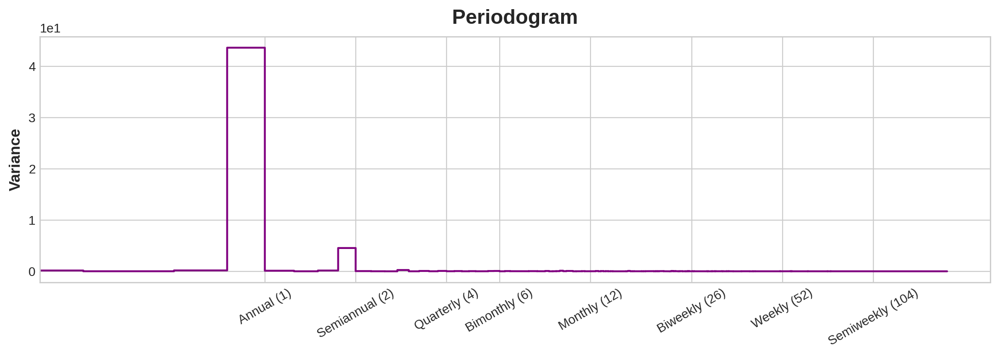

In [37]:
# traçons le périodogramme
plot_periodogram(df["meantemp"])

Le périodogramme confirme les observations des seasonal plots. Nous pouvons clairement voir que les periodicités ayant la plus grande variance sont 'Annuel' et 'semi Annuel', donc c'est sur cette periode que nous allons effectuer nos analyses, et ce à l'aide des Fourier features qui sont plus adaptées à ce cas de figure que les indicateurs.

Nous allons déterminer les paires de fourier à partir du périodogramme, c'est-à-dire en utilisant la fonction : 

```
# CalendarFourier(freq="A",order=2) # A = saisonnalité annuelle, 2 paires sin/cos
```



- **Utiliser les Deterministic Process avec le CalendarFourier afin de détecter la saisonnalité**

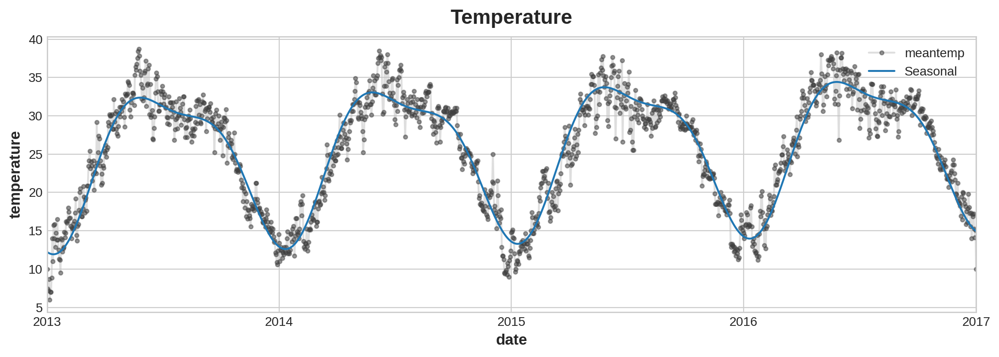

In [38]:
y = df["meantemp"].copy()
y.index = pd.to_datetime(y.index) # comme ca les index sont en format date, car le Deterministic process ne peut fonctionner uniquement avec les format date

# on lance l'analyse en utilisant le processus déterministique
fourier = CalendarFourier(freq="A",order=2) # A = saisonnalité annuelle, 2 paires sin/cos
dp = DeterministicProcess(
    index=y.index,
    constant=True,
    order=1,
    additional_terms=[fourier],
    drop=True,
)
X = dp.in_sample()

# on créer maintenant un seasonal model pour afficher la saisonnalité
model = LinearRegression().fit(X, y)
y_pred = pd.Series(
    model.predict(X),
    index=X.index,
    name='Fitted',
)

# affichage de la saisonnalité
y_pred = pd.Series(model.predict(X), index=X.index)
ax = y.plot(**plot_params, alpha=0.5, title="Temperature", ylabel="temperature")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax.legend()

Comme on peut le constater on a une saisonalité annuelle, ce qui est logique car la temperature fluctue en fonction des saisons. Et ce procéssus se répète chaque année.

- **Appliquer ces méthodes sur la variable après élimination de la composante de tendance**

Text(0.5, 1.0, 'Detrended')

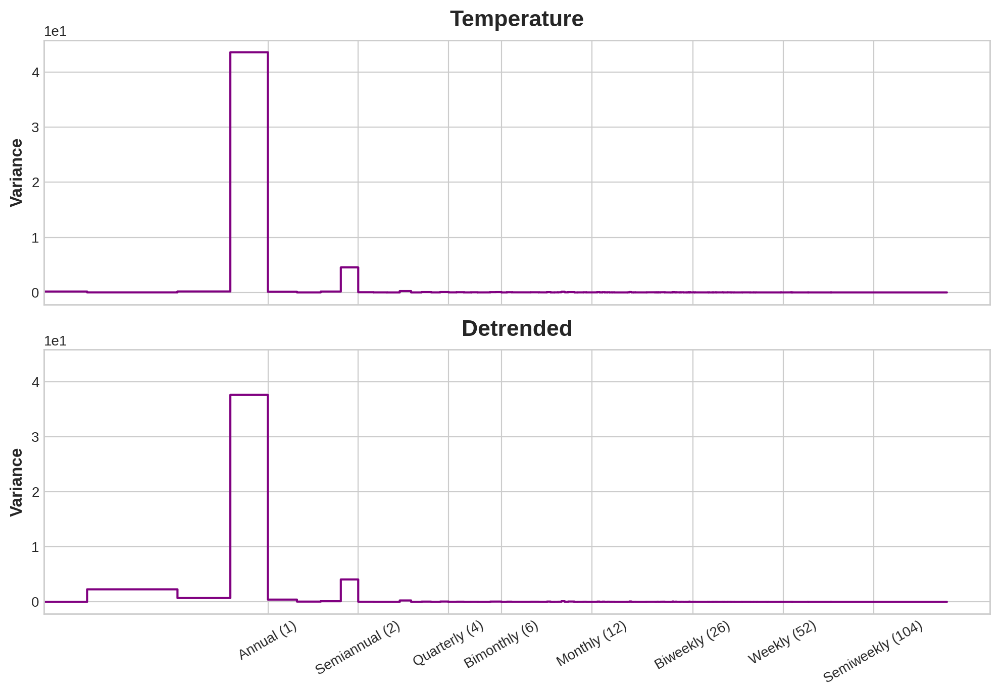

In [39]:
# appliquons le périodogramme sur la série après élimination de la tendance et comparons avec le périodogramme d'avant
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(10, 7))
ax1 = plot_periodogram(y, ax=ax1)
ax1.set_title("Temperature")
ax2 = plot_periodogram(y_detrended, ax=ax2)
ax2.set_title("Detrended")

Nous voyons qu'il n'y a aucune différence, les fréquences présentant le plus de variance restent les mêmes, ce qui nous montre bien que le périodogramme capte uniquement la saisonnalité.

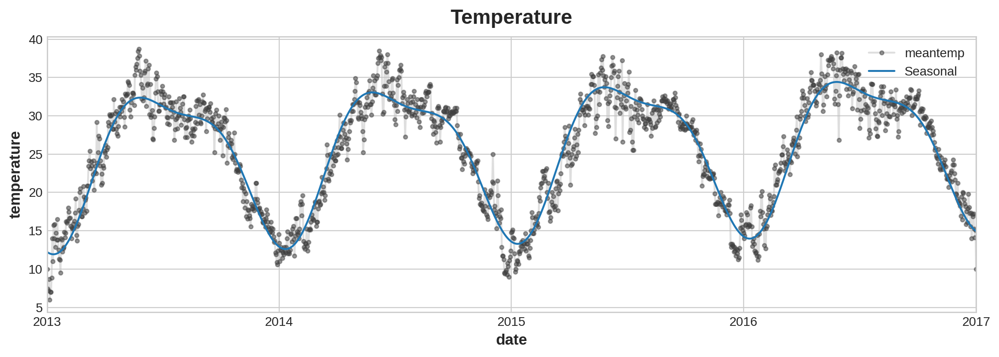

In [40]:
X = y_detrended.to_frame()
y.index = pd.to_datetime(y.index) # comme ca les index sont en format date, car le Deterministic process ne peut fonctionner uniquement avec les format date

# on lance l'analyse en utilisant le processus déterministique
fourier = CalendarFourier(freq="A",order=2) # A = saisonnalité annuelle, 2 paires sin/cos
dp = DeterministicProcess(
    index=y.index,
    constant=True,
    order=1,
    additional_terms=[fourier],
    drop=True,
)
X = dp.in_sample()

# on créer maintenant un seasonal model pour afficher la saisonnalité
model = LinearRegression().fit(X, y)
y_pred = pd.Series(
    model.predict(X),
    index=X.index,
    name='Fitted',
)

# affichage de la saisonnalité
y_pred = pd.Series(model.predict(X), index=X.index)
ax = y.plot(**plot_params, alpha=0.5, title="Temperature", ylabel="temperature")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax.legend()

Aucune différence non plus suite au deterministic process, ce qui nous montre bien que le dp a saisi uniquement la saisonnalité.

En revanche, si nous éliminons la composante de saisonnalité, nous voyons que le périodogramme ne capte plus les fréquences.

Text(0.5, 1.0, 'Deseasonalized')

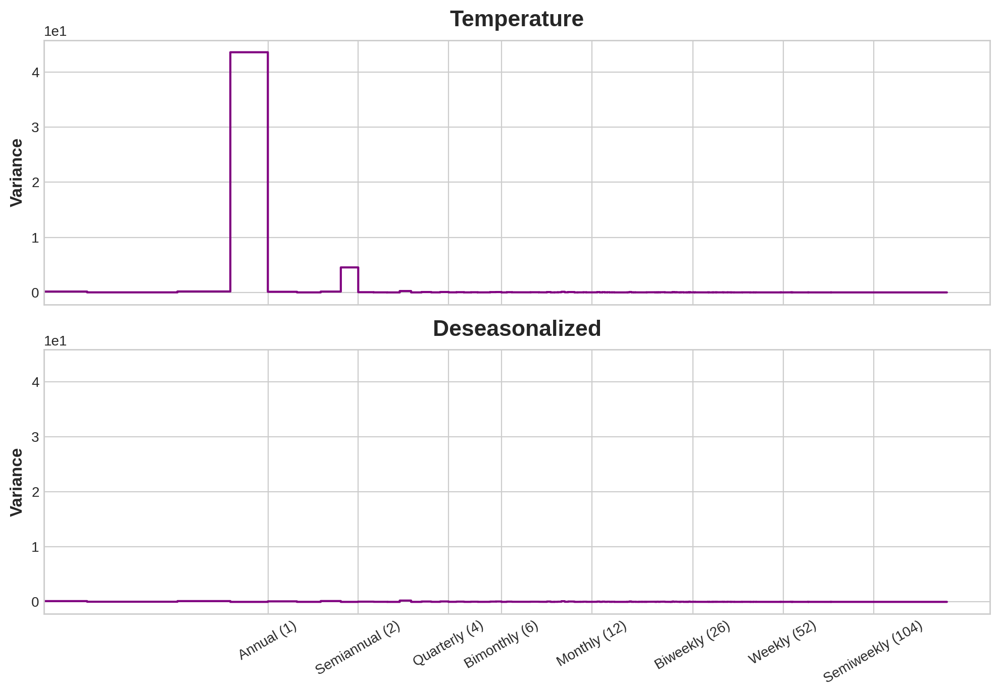

In [41]:
y_deseason = y - y_pred

# affichons les periodogrammes afin de montrer la différence 
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(10, 7))
ax1 = plot_periodogram(y, ax=ax1)
ax1.set_title("Temperature")
ax2 = plot_periodogram(y_deseason, ax=ax2)
ax2.set_title("Deseasonalized")

Comme notre periodogramme déseasonalized ne présente pas de fréquences caractéristiques, et en le comparant au periodogramme original, nous pouvons en déduire que **le modèle a été en mesure de capturer la variation saisonnière.**

- **Faire un forecast pour 15 jours futurs**

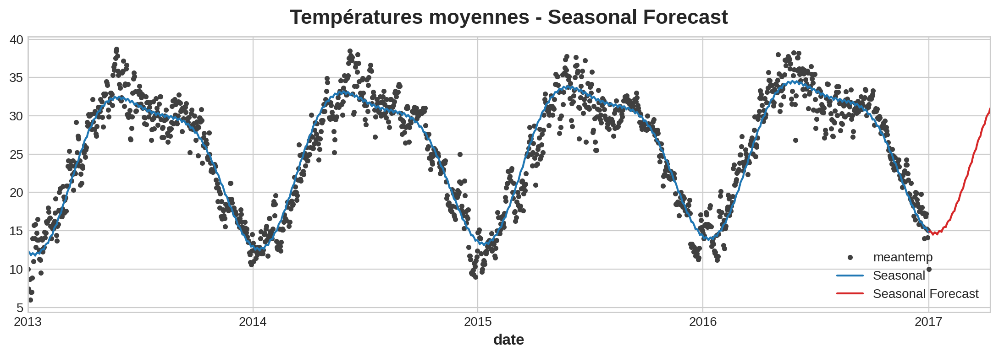

In [42]:
y = df["meantemp"].copy()
y.index = pd.to_datetime(y.index)
y.index = y.index.to_period()

fourier = CalendarFourier(freq="A",order=2) # A = saisonnalité annuelle, 2 paires sin/cos
dp = DeterministicProcess(
    index=y.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=1,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[fourier],  # annual seasonality (fourier)
    drop=True  
)

X = dp.in_sample()

X_fore = dp.out_of_sample(steps=100)

model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)

y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

ax = y.plot(color='0.25', style='.', title="Températures moyennes - Seasonal Forecast")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax = y_fore.plot(ax=ax, label="Seasonal Forecast", color='C3')
_ = ax.legend()

- **Eliminer la saisonnalité de la composante privée de tendance**

Cela a déjà été réalisé ci-dessus pour comparer les séries detrendend et deseasonnalized. Nous traçons ici la série afin de la visualiser sans tendance ni saisonnalité, et voyons qu'elle ne représente maintenant plus que les cycles et le bruit.

Text(0.5, 1.0, 'Températures moyennes (deseasonalized)')

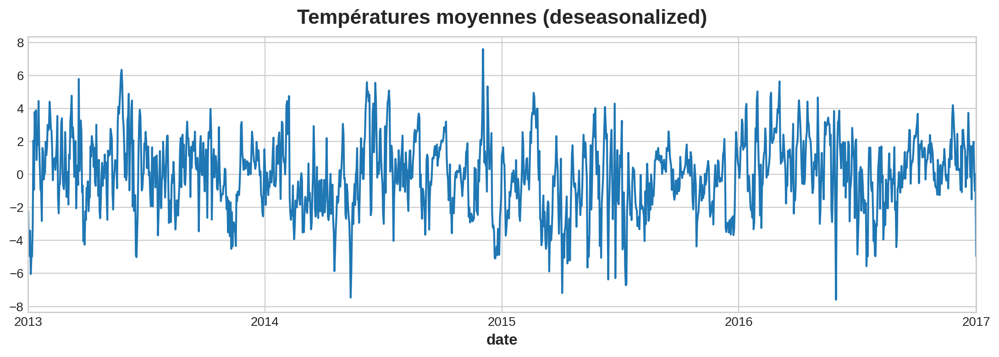

In [43]:
ax = y_deseason.plot()
ax.set_title("Températures moyennes (deseasonalized)")

# Partie 4

En réitérant les processus vus en cours; analyser les cycles par le biais des Lagged Features:
- Tracer les courbes d’autocorrelation partielle
- Identifier les corrélations avec les Lags passés
- Analyser les cycles par le biais de Lags passés
- Faire un forecast pour 15 jours futurs
- Soustraire les cycles de la composante sans tendance ni saisonnalité

- **Tracer les courbes d’autocorrelation partielle**

In [44]:
# créons un dataframe lag avec 12 shifts
y = y_detrended.copy()
df_lag = pd.DataFrame({
    'y': y,
    'y_lag_1': y.shift(1),
    'y_lag_2': y.shift(2),    
    'y_lag_3': y.shift(3),    
    'y_lag_4': y.shift(4), 
    'y_lag_5': y.shift(5),     
    'y_lag_6': y.shift(6),
    'y_lag_7': y.shift(7),
    'y_lag_8': y.shift(8), 
    'y_lag_9': y.shift(9), 
    'y_lag_10': y.shift(10), 
    'y_lag_11': y.shift(11), 
    'y_lag_12': y.shift(12) 
})
df_lag.head()

,y,y_lag_1,y_lag_2,y_lag_3,y_lag_4,y_lag_5,y_lag_6,y_lag_7,y_lag_8,y_lag_9,y_lag_10,y_lag_11,y_lag_12
date,,,,,,,,,,,,,
2013-01-01,-7.991813,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,-10.664019,-7.991813,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-03,-10.969192,-10.664019,-7.991813,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-04,-9.540664,-10.969192,-10.664019,-7.991813,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-05,-12.278437,-9.540664,-10.969192,-10.664019,-7.991813,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [45]:
# créons les fonctions nécessaires
from statsmodels.graphics.tsaplots import plot_pacf

def lagplot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    from matplotlib.offsetbox import AnchoredText
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean()) / x_.std()
    if y is not None:
        y_ = (y - y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    corr = y_.corr(x_)
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha=0.75,
        s=3,
    )
    line_kws = dict(color='C3', )
    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws=scatter_kws,
                     line_kws=line_kws,
                     lowess=True,
                     ax=ax,
                     **kwargs)
    at = AnchoredText(
        f"{corr:.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel=x_.name, ylabel=y_.name)
    return ax

def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):
    import math
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil(lags / nrows))
    kwargs.setdefault('figsize', (kwargs['ncols'] * 2, nrows * 2 + 0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k + 1 <= lags:
            ax = lagplot(x, y, lag=k + 1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k + 1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis('off')
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[:, 0], ylabel=y.name if y is not None else x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig

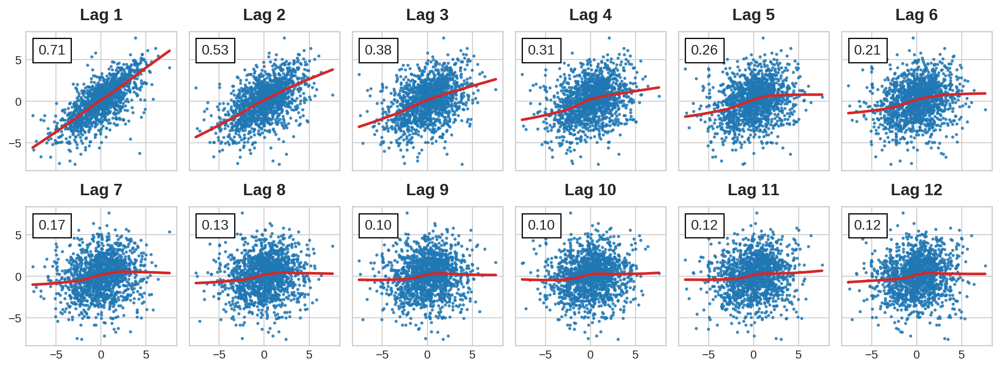

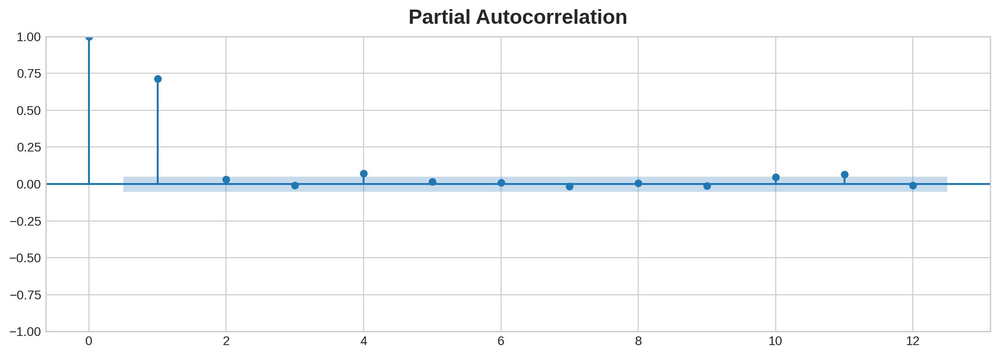

In [46]:
# traçons les lag plots et les autocorrélations partielles
_ = plot_lags(y_deseason, lags=12, nrows=2)
_ = plot_pacf(y_deseason, lags=12)

- **Identifier les corrélations avec les Lags passés**

Les lag plots nous indiquent des relations linéaires entre la température et la température aux jours -1 à -12. Nous voyons qu'à mesure que nous nous éloignons et arrivons vers le jour -12, la variable se décorrèle d'elle-même. Si nous regardons sur l'autocorrélogramme, nous voyons qu'il n'y a que les lag 1 et 2 qui nous apportent une variance significative. Au-delà, nous n'apprenons plus rien de nos données. Cela signifie donc que la température à lag 1 et lag 2 (en d'autres termes J-1 et J-2) est une bonne prédictrice de la température qu'il fera dans les 2 jours, au-delà, cela reste aléatoire et il est difficile d'établir un lien. 

- **Analyser les cycles par le biais de Lags passés**

In [47]:
def make_lags(ts, lags):
    return pd.concat(
        {
            f'y_lag_{i}': ts.shift(i)
            for i in range(1, lags + 1)
        },
        axis=1)

X = make_lags(y_deseason, lags=1)
X = X.fillna(0.0)

In [48]:
X.head(5).round()

,y_lag_1
date,
2013-01-01,0.0
2013-01-02,-2.0
2013-01-03,-5.0
2013-01-04,-5.0
2013-01-05,-3.0


In [49]:
from sklearn.model_selection import train_test_split

# Create target series and data splits
y = y_deseason.copy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=60, shuffle=False)

# Fit and predict
model = LinearRegression(fit_intercept=True)  # `fit_intercept=True` since we didn't use DeterministicProcess
model.fit(X_train, y_train)
y_pred = pd.Series(model.predict(X_train), index=y_train.index)
y_fore = pd.Series(model.predict(X_test), index=y_test.index)

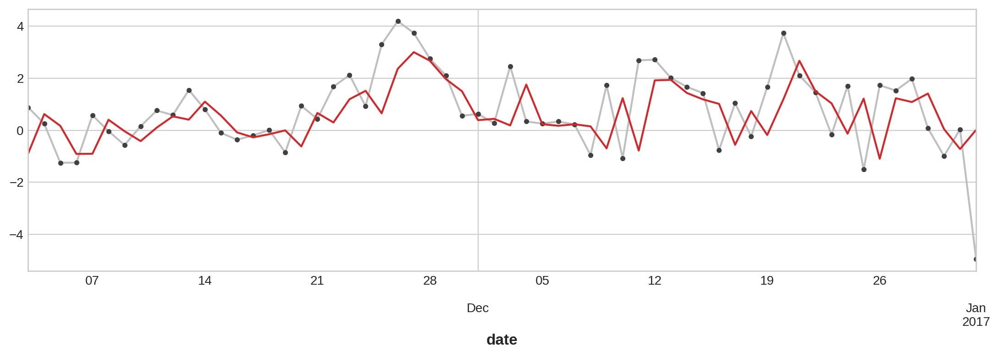

In [50]:
ax = y_test.plot(**plot_params)
_ = y_fore.plot(ax=ax, color='C3')

Notre modèle est plutôt à même, malgré son décalage, de prédire le comportement de notre variable. En effet, nous parvenons à visualiser la corrélation que nous a indiquée le corrélogramme, les pics et les creux semblent assez bien correspondre. Nous pourrions interpréter les variations observées en cycles (pics-creux) par des variations inhérentes au rythme jour-nuit.

- **Faire un forecast pour 15 jours futurs**

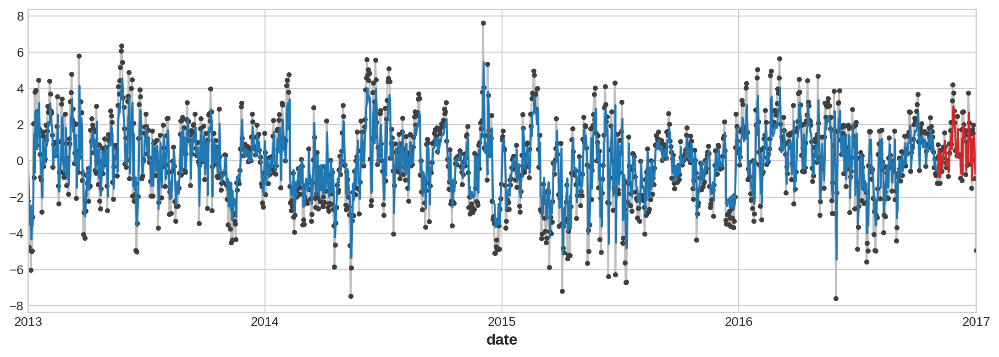

In [51]:
ax = y_train.plot(**plot_params)
ax = y_test.plot(**plot_params)
ax = y_pred.plot(ax=ax)
_ = y_fore.plot(ax=ax, color='C3')

- **Soustraire les cycles de la composante sans tendance ni saisonnalité**

Text(0.5, 1.0, 'Températures moyennes (decycled)')

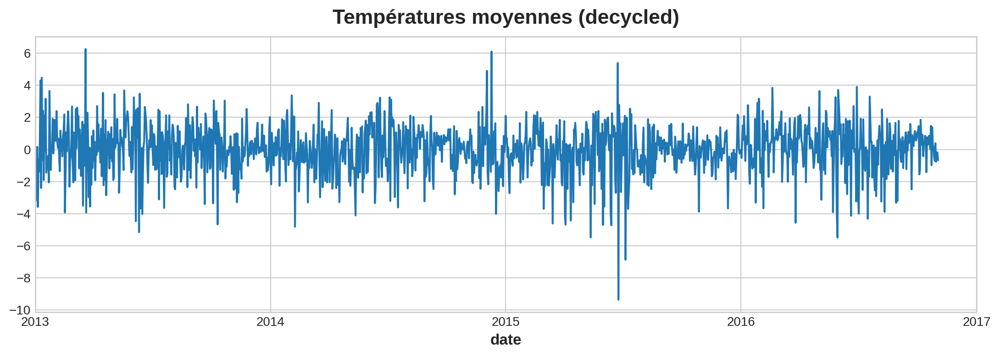

In [52]:
y_decycled = y_deseason - y_pred
ax = y_decycled.plot()
ax.set_title("Températures moyennes (decycled)")

Nous n'avons donc à présent plus que le bruit.

# Partie 5

**Appliquer les processus hybrides**

In [53]:
# model de regression (lin simple pour la tendance) + model XgBoost (ca peut aussi etre une random forest.)
# on peut choisir nos données exogènes. liberté totale.

In [70]:
import warnings

# Use the warnings module in your code
warnings.warn("This is a warning message.")


In [72]:
# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc(
    "figure",
    autolayout=True,
    figsize=(11, 4),
    titlesize=18,
    titleweight='bold',
)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
)

data = pd.read_csv(path, index_col='date')
data = ["meantemp", "humidity"," wind_speed","meanpressure"]

Pour trouver la meilleure variable on fait un test de corrélation:

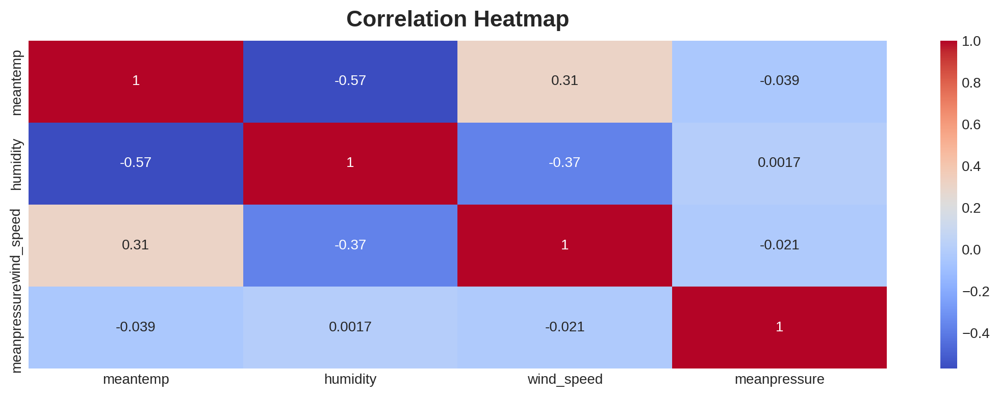

In [73]:
data = pd.read_csv(path, index_col='date')
#corelation
correlation_matrix = data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

Il existe une corrélation entre humidity et meantemp (-0.57), qui est assez forte pour pouvoir prédire meantemp avec les donnees de humidity.

In [74]:
data = ["meantemp", "humidity"]

Nous définissons les deux colonnes qui sont meantemp et humidity, l'index de temp (date) avec la variable retail. 

In [75]:
df["time"] = np.arange(len(df.index))
df.head()

,meantemp,Lag_1,time
date,,,
2013-01-01,10.000000,NaN,0
2013-01-02,7.400000,10.000000,1
2013-01-03,7.166667,7.400000,2
2013-01-04,8.666667,7.166667,3
2013-01-05,6.000000,8.666667,4


In [76]:
retail = pd.read_csv(
    path, index_col='date',
    usecols=['date'] + data,
    parse_dates=['date'],
).to_period('D').reindex(columns=data)
retail = pd.concat({'meteo': retail}, names=[None ,'Meteo'], axis=1)
retail.head()

meteo           
Meteo        meantemp   humidity
date                            
2013-01-01  10.000000  84.500000
2013-01-02   7.400000  92.000000
2013-01-03   7.166667  87.000000
2013-01-04   8.666667  71.333333
2013-01-05   6.000000  86.833333

Maintenant nous voulons faire une régression linéaire avec trend (tendance), en utilisant l'ordre 6 

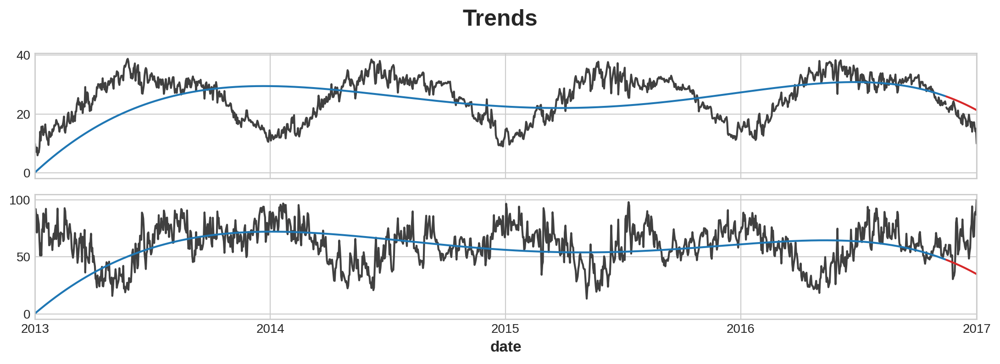

In [77]:
y = retail.copy()

# Créer trend features
dp = DeterministicProcess(
    index=y.index,  # dates provenant des données d'entraînement
    constant=True,  # l'interception
    order=6,        # trend order 6
    drop=True,      # supprimer les termes pour éviter la colinéarité
)
X = dp.in_sample()  # features pour les données d'entraînement

# Tester sur les années 2016-2019. Il sera plus facile pour nous plus tard si nous
# séparons l'index de la date plutôt que le dataframe directement. #il faut separer les donnee(par rapport au temps)
idx_train, idx_test = train_test_split(
    y.index, test_size=12 * 4, shuffle=False,
)
X_train, X_test = X.loc[idx_train, :], X.loc[idx_test, :]
y_train, y_test = y.loc[idx_train], y.loc[idx_test]

# Ajuster le modèle de tendance
model = LinearRegression(fit_intercept=False)
model.fit(X_train, y_train)

# Faire des prédictions
y_fit = pd.DataFrame(
    model.predict(X_train),
    index=y_train.index,
    columns=y_train.columns,
)
y_pred = pd.DataFrame(
    model.predict(X_test),
    index=y_test.index,
    columns=y_test.columns,
)

# Plot
axs = y_train.plot(color='0.25', subplots=True, sharex=True)
axs = y_test.plot(color='0.25', subplots=True, sharex=True, ax=axs)
axs = y_fit.plot(color='C0', subplots=True, sharex=True, ax=axs)
axs = y_pred.plot(color='C3', subplots=True, sharex=True, ax=axs)
for ax in axs: ax.legend([])
_ = plt.suptitle("Trends")

Ici nous avons extrait la tendance (trend) et nous l'avons affichée avec les données. Nous avons aussi complété les données grâce à une régression quadratique qui a permis de prédire certains points suivants, on remarque une toute petite courbure.

In [78]:
# La méthode `stack` convertit les étiquettes de colonne en étiquettes de ligne, en passant du format large au format long
X = retail.stack()  # pivot dataset wide to long
display(X.head())
y = X.pop('meteo') 

meteo
date       Meteo              
2013-01-01 meantemp  10.000000
           humidity  84.500000
2013-01-02 meantemp   7.400000
           humidity  92.000000
2013-01-03 meantemp   7.166667

In [79]:
# Turn row labels into categorical feature columns with a label encoding
X = X.reset_index('Meteo')
# Label encoding for 'Industries' feature
for colname in X.select_dtypes(["object", "category"]):
    X[colname], _ = X[colname].factorize()

# Label encoding for annual seasonality
X["date"] = X.index.month  # values are 1, 2, ..., 12

# Create splits
X_train, X_test = X.loc[idx_train, :], X.loc[idx_test, :]
y_train, y_test = y.loc[idx_train], y.loc[idx_test]

Maintenant nous allons convertir la tendance créee précédemment en format long (empilement de la fonction stack()) puis la soustraire de la série originale, ceci nous donnera la série detrended (sans tendance) c'est les résidus que les XGBoost peuvent apprendre.

In [80]:
# Pivot wide to long (stack) and convert DataFrame to Series (squeeze)
y_fit = y_fit.stack().squeeze()    # trend from training set
y_pred = y_pred.stack().squeeze()  # trend from test set

# Create residuals (the collection of detrended series) from the training set
y_resid = y_train - y_fit

# Train XGBoost on the residuals
xgb = XGBRegressor()
xgb.fit(X_train, y_resid)

# Add the predicted residuals onto the predicted trends
y_fit_boosted = xgb.predict(X_train) + y_fit
y_pred_boosted = xgb.predict(X_test) + y_pred

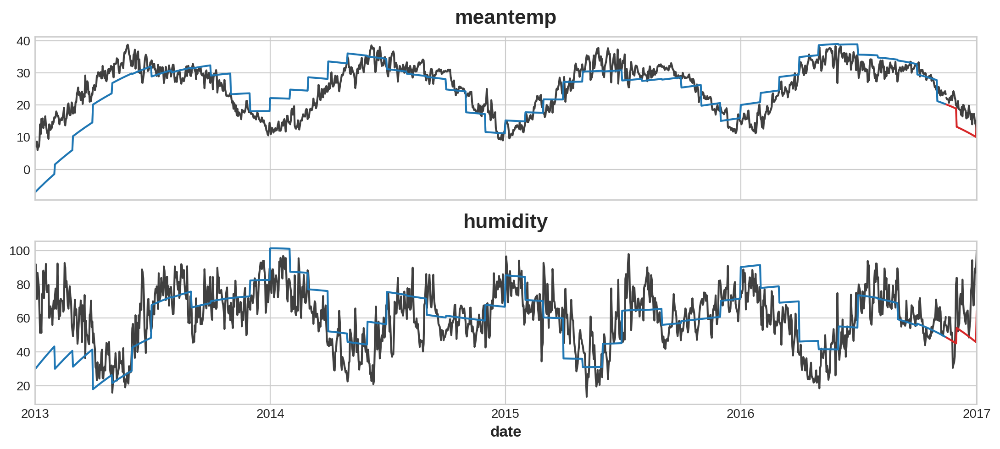

In [81]:
axs = y_train.unstack(['Meteo']).plot(
    color='0.25', figsize=(11, 5), subplots=True, sharex=True,
    title=['meantemp', 'humidity'],
)
axs = y_test.unstack(['Meteo']).plot(
    color='0.25', subplots=True, sharex=True, ax=axs,
)
axs = y_fit_boosted.unstack(['Meteo']).plot(
    color='C0', subplots=True, sharex=True, ax=axs,
)
axs = y_pred_boosted.unstack(['Meteo']).plot(
    color='C3', subplots=True, sharex=True, ax=axs,
)
for ax in axs: ax.legend([])

La donnée fit est bien représentée, on peut en distinguer la tendance entrainée avec XGBoost et la regression linéaire. Le XGBoost n'est pas suffisant à mieux prédire la "meantemp". 

ANN

In [82]:
data = pd.read_csv(path, index_col='date')
data.head()

,meantemp,humidity,wind_speed,meanpressure
date,,,,
2013-01-01,10.000000,84.500000,0.000000,1015.666667
2013-01-02,7.400000,92.000000,2.980000,1017.800000
2013-01-03,7.166667,87.000000,4.633333,1018.666667
2013-01-04,8.666667,71.333333,1.233333,1017.166667
2013-01-05,6.000000,86.833333,3.700000,1016.500000


In [85]:
ann_data=data[['meantemp','humidity']]
ann_data

,meantemp,humidity
date,,
2013-01-01,10.000000,84.500000
2013-01-02,7.400000,92.000000
2013-01-03,7.166667,87.000000
2013-01-04,8.666667,71.333333
2013-01-05,6.000000,86.833333
...,...,...
2016-12-28,17.217391,68.043478
2016-12-29,15.238095,87.857143
2016-12-30,14.095238,89.666667


In [86]:
#on sépare les données en train (80%) et test (20%) data.
train_percentage=int(round(len(ann_data)*(80/100),0))
train_percentage
train=ann_data[:train_percentage].sort_index()
test=ann_data[train_percentage:].sort_index()
len(train)+len(test)

1462

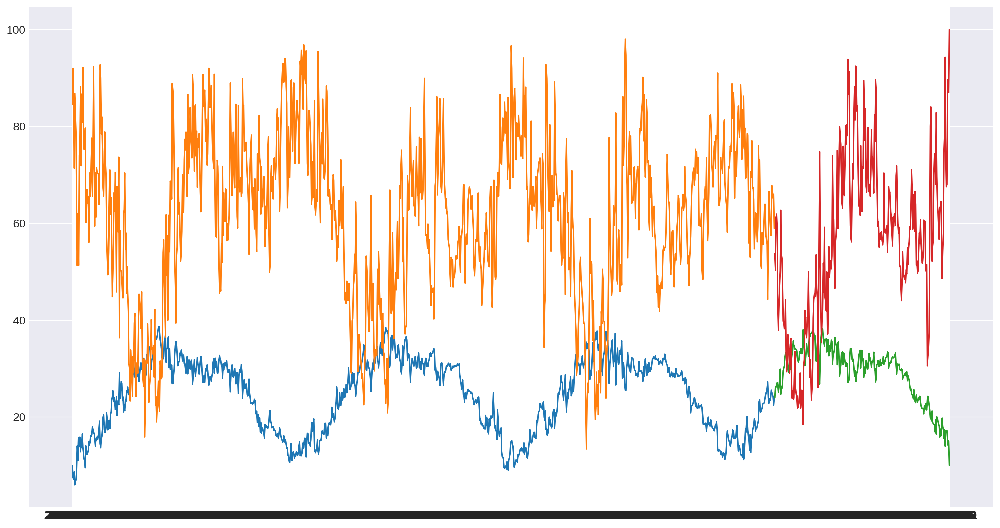

In [102]:
#représentation graphique
plt.figure(figsize=(15,8))
plt.plot(train)
plt.plot(test)
plt.show()

In [87]:
#we scale the data
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(-1, 1))
train_sc = scaler.fit_transform(train)
test_sc = scaler.transform(test)

In [88]:
X_train = train_sc[:-1]
y_train = train_sc[1:]

In [89]:
X_test = test_sc[:-1]
y_test = test_sc[1:]

In [90]:
X_train.shape

(1169, 2)

In [91]:
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense
from keras.callbacks import EarlyStopping
nn_model = Sequential()
nn_model.add(Dense(6, input_dim=2, activation='relu')) #1 hidden layer. On a définit la couche d'entrée à 2 dimensions
nn_model.add(Dense(2))# 1 output layer avec 2 dimensions, comme on renvoi 2 output
nn_model.compile(loss='mean_squared_error', optimizer='adam') #l'erreur est calculé avec la méthode du moindre carré. Pour optimiser les poids on utilise Adam.
early_stop = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=2, verbose=1) #we initiate an early stopping so that when there is no evolution our model stops.
y_fit = nn_model.fit(X_train, y_train, epochs=100, batch_size=1, verbose=1, callbacks=[early_stop], shuffle=False)

Epoch 1/100
1169/1169 [==============================] - 2s 1ms/step - loss: 0.0925
Epoch 2/100
1169/1169 [==============================] - 3s 2ms/step - loss: 0.0396
Epoch 3/100
1169/1169 [==============================] - 5s 4ms/step - loss: 0.0276
Epoch 4/100
1169/1169 [==============================] - 4s 3ms/step - loss: 0.0246
Epoch 5/100
1169/1169 [==============================] - 4s 3ms/step - loss: 0.0236
Epoch 6/100
1169/1169 [==============================] - 4s 3ms/step - loss: 0.0233
Epoch 7/100
1169/1169 [==============================] - 5s 5ms/step - loss: 0.0231
Epoch 8/100
1169/1169 [==============================] - 4s 3ms/step - loss: 0.0230
Epoch 9/100
1169/1169 [==============================] - 3s 3ms/step - loss: 0.0230
Epoch 10/100
1169/1169 [==============================] - 5s 4ms/step - loss: 0.0229
Epoch 11/100
1169/1169 [==============================] - 3s 3ms/step - loss: 0.0229
Epoch 12/100
1169/1169 [==============================] - 2s 2ms/step - lo

In [94]:
nn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 6)                 18        
                                                                 
 dense_1 (Dense)             (None, 2)                 14        
                                                                 
Total params: 32
Trainable params: 32
Non-trainable params: 0
_________________________________________________________________


In [95]:
from sklearn.metrics import r2_score
#we predict our model and get R2 score for train and test
y_pred_test_nn = nn_model.predict(X_test)
y_train_pred_nn = nn_model.predict(X_train)
print(y_train.shape)
print(y_train_pred_nn.shape)

37/37 [==============================] - 0s 1ms/step
(1169, 2)
(1169, 2)


In [96]:
#we use the R squared score to identify the accuracy of our model.
print("The R2 score on the Train set is:\t{:0.3f}".format(r2_score(y_train, y_train_pred_nn)))
print("The R2 score on the Test set is:\t{:0.3f}".format(r2_score(y_test, y_pred_test_nn)))

The R2 score on the Train set is:	0.858
The R2 score on the Test set is:	0.855


In [97]:
# on cherche les résidus de train et test.
y_resid= y_train-y_train_pred_nn

In [98]:
xgb = XGBRegressor()
xgb.fit(X_train, y_resid)

# Add the predicted residuals onto the predicted trends
y_fit_boosted = xgb.predict(X_train) + y_train_pred_nn
y_pred_boosted = xgb.predict(X_test) + y_pred_test_nn

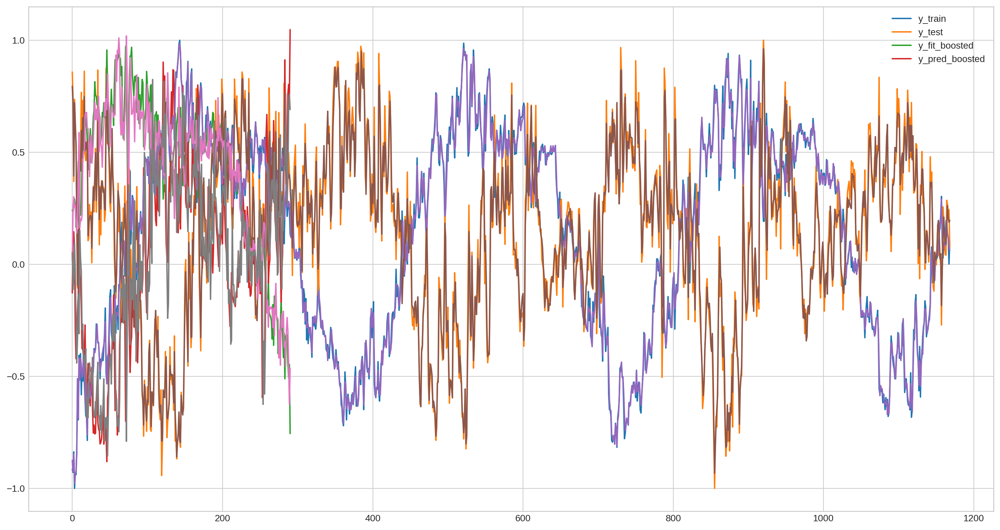

In [99]:
plt.figure(figsize=(15,8))
plt.plot(y_train)
plt.plot(y_test)
plt.plot(y_fit_boosted)
plt.plot(y_pred_boosted)
plt.legend(["y_train","y_test","y_fit_boosted","y_pred_boosted"])
plt.show()

In [100]:
y_fit_boosted_meanTemp=y_fit_boosted[:,0]
y_fit_boosted_humidity=y_fit_boosted[:,1]

y_pred_boosted_meanTemp=y_fit_boosted[:,0]
y_pred_boosted_humidity=y_fit_boosted[:,1]

y_ann = np.concatenate((y_train, y_test))
y_ann_meanTemp=y_ann[:,0]
y_ann_humidity=y_ann[:,1]

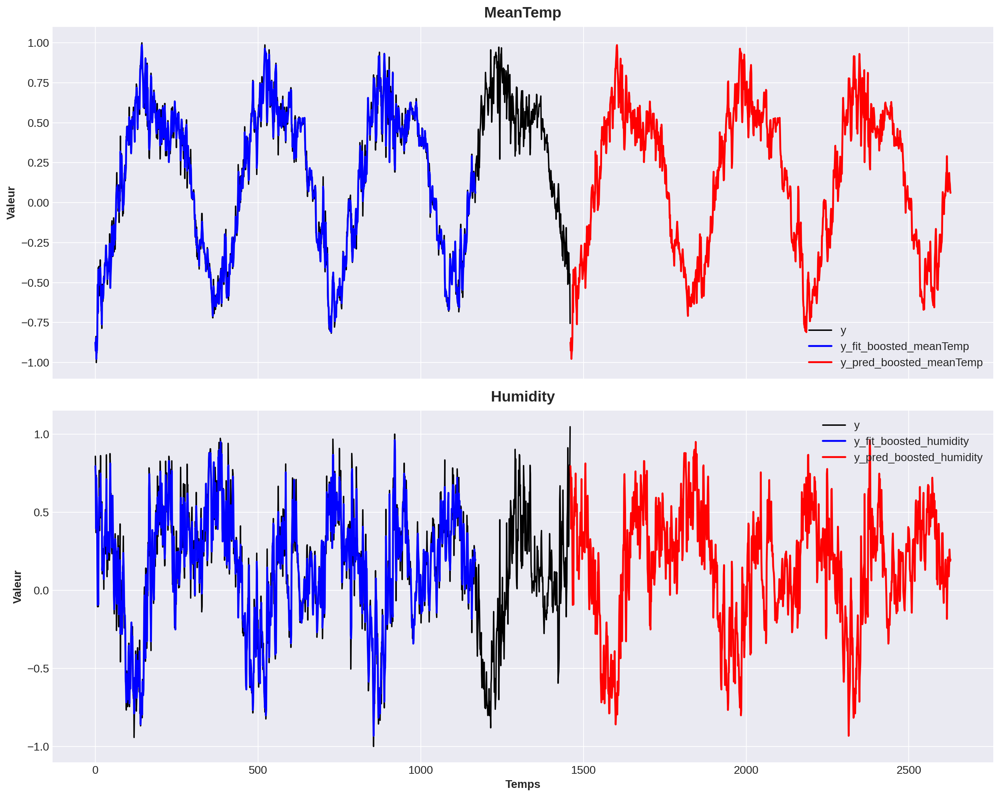

In [101]:
# Paramètres de style
plt.style.use('seaborn-darkgrid')
plt.rcParams['font.size'] = 12

# Création des sous-graphiques
fig, axs = plt.subplots(2, 1, figsize=(15, 12), sharex=True)

# Tracé du premier graphique
axs[0].plot(y_ann_meanTemp, label='y', color='black')
axs[0].plot(y_fit_boosted_meanTemp, linewidth=2, label='y_fit_boosted_meanTemp', color='blue')
axs[0].plot(range(len(y_ann_meanTemp), len(y_ann_meanTemp) + len(y_pred_boosted_meanTemp)), y_pred_boosted_meanTemp,
            linewidth=2, label='y_pred_boosted_meanTemp', color='red')
axs[0].set_title('MeanTemp', fontsize=16)
axs[0].legend(loc='best', fontsize=12)
axs[0].set_ylabel('Valeur', fontsize=12)

# Tracé du deuxième graphique
axs[1].plot(y_ann_humidity, label='y', color='black')
axs[1].plot(y_fit_boosted_humidity, linewidth=2, label='y_fit_boosted_humidity', color='blue')
axs[1].plot(range(len(y_ann_humidity), len(y_ann_humidity) + len(y_pred_boosted_humidity)), y_pred_boosted_humidity,
            linewidth=2, label='y_pred_boosted_humidity', color='red')
axs[1].set_title('Humidity', fontsize=16)
axs[1].legend(loc='best', fontsize=12)
axs[1].set_xlabel('Temps', fontsize=12)
axs[1].set_ylabel('Valeur', fontsize=12)

# Ajustement automatique de la disposition
plt.tight_layout()

# Affichage des graphiques
plt.show()

Notre model a bien pu prédire l'évolution des données, que ce soit de l'humidité ou du meanTemp. On peut le voir car la saisonnalité à pu être reproduite. Donc la combinaison ANN + XGBoost est un bon outil de prédiction.